# **Практическая работа №9. Использование модели YOLOv26 для решение задач детекции и классификации**

## **Задание 1. Знакомство с новейшей версией модели YOLO**

- Ознакомьтесь с технической документацией по новейшей версии модели YOLOv26: https://docs.ultralytics.com/ru/models/yolo26/

- Рассмотрите пример обучения этой модели c использованием датасетов, созданных в Roboflow: https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolo26-object-detection-on-custom-dataset.ipynb?ref=blog.roboflow.com

### **Ответьте на вопрос: Какие принципиальные отличия появились в модели YOLOv26 относительно предыдущих версий?**

**ВАШ ОТВЕТ**

*Примечание:* для каждого последующего задания, в конечном итоге, необходимо сформировать обученную модель и задеплоить её на сервисе **RoboFlow**



## **Задание 2. Найдите готовый датасет для детекции объектов и обучите на нем модель YOLOv26:**

- Для удобства работы с датасетом и деплоя модели используйте сервис [RoboFlow](https://roboflow.com/)

In [ ]:
!pip install -q ultralytics roboflow

from ultralytics import YOLO
import torch, os

print("Torch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())


model = YOLO("yolo26n.pt")  # маленький вариант
model.info()                # краткая сводка по архитектуре

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 33.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.9/207.9 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 55.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 69.6 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Torch: 2.11.0+cu128
CUDA available: True
YOLO26n summary: 260 layers, 2,572,280 parameters, 0 gradients, 6.1 GFLOPs


(260, 2572280, 0, 6.1192448)

In [ ]:
from roboflow import Roboflow

# Вариант 1: просто вставить ключ
RF_API_KEY = "UuRJ1ewAVoaCpX4GC43H"

rf = Roboflow(api_key=RF_API_KEY)
workspace = rf.workspace("-rok2b")         # см. в URL проекта
project   = workspace.project("my-first-project-nmchj")     # тоже берётся из URL
version   = project.version(1)                    # номер версии
dataset   = version.download("yolov11")           # формат совместим с YOLO26
print(dataset.location)

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to My-First-Project-1 in yolov11:: 100%|██████████| 1753/1753 [00:00<00:00, 7880.50it/s]

/content/My-First-Project-1


In [ ]:
data_yaml = os.path.join(dataset.location, "data.yaml")
print(open(data_yaml).read())

results = model.train(
    data=data_yaml,
    epochs=50,
    imgsz=640,
    batch=16,
    device=0 if torch.cuda.is_available() else "cpu"
)

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 24
names: ['Bicycle', 'Bike', 'Car', 'Cyclist', 'Pedestrian', 'Persona', 'Signboard', 'Stopper', 'aeroplane', 'bicycle', 'boat', 'bottle', 'bus', 'car', 'chair', 'cow', 'dog', 'horse', 'motorbike', 'person', 'sheep', 'sofa', 'train', 'tvmonitor']

roboflow:
  workspace: -rok2b
  project: my-first-project-nmchj
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/-rok2b/my-first-project-nmchj/dataset/1
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/My-First-Project-1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False

In [ ]:
# Оценка на валидации
metrics = model.val()
print(metrics)

# Инференc
results = model.predict(
    source=os.path.join(dataset.location, "test", "images"),
    save=True
)

Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26n summary (fused): 122 layers, 2,379,516 parameters, 0 gradients, 5.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1403.8±696.7 MB/s, size: 31.3 KB)
val: Scanning /content/My-First-Project-1/valid/labels.cache... 94 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 94/94 49.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 1.5s/it 8.8s
                   all         94       2370      0.516      0.449      0.487      0.395
               Bicycle         40        200      0.904      0.896       0.97      0.893
                  Bike         40         40      0.995          1      0.995      0.902
                   Car         40         40       0.98          1      0.995      0.993
            Pedestrian         40       1757      0.826      0.675       0.81      0.464
               Persona         30       


image 1/68 /content/My-First-Project-1/test/images/000075_jpg.rf.a4c732eaf06804af2fd4169230ba0aab.jpg: 640x640 6 Bicycles, 1 Bike, 2 Cars, 37 Pedestrians, 1 Signboard, 4 Stoppers, 10.1ms
image 2/68 /content/My-First-Project-1/test/images/000104_jpg.rf.62f62ebe692e6a5005638ef4381057a3.jpg: 640x640 7 Bicycles, 1 Bike, 1 Car, 37 Pedestrians, 1 Signboard, 3 Stoppers, 11.0ms
image 3/68 /content/My-First-Project-1/test/images/000121_jpg.rf.57029afbbded4009dbdbb629e3a60730.jpg: 640x640 6 Bicycles, 1 Bike, 2 Cars, 40 Pedestrians, 1 Signboard, 4 Stoppers, 10.7ms
image 4/68 /content/My-First-Project-1/test/images/000123_jpg.rf.6a1a07142a3a946554fae0822f4c943f.jpg: 640x640 5 Bicycles, 1 Bike, 2 Cars, 41 Pedestrians, 1 Signboard, 3 Stoppers, 10.8ms
image 5/68 /content/My-First-Project-1/test/images/000127_jpg.rf.606468b0bea11c6b9b6ba8fbe78e28fa.jpg: 640x640 7 Bicycles, 1 Bike, 2 Cars, 41 Pedestrians, 1 Signboard, 3 Stoppers, 11.0ms
image 6/68 /content/My-First-Project-1/test/images/000146_jpg.rf.

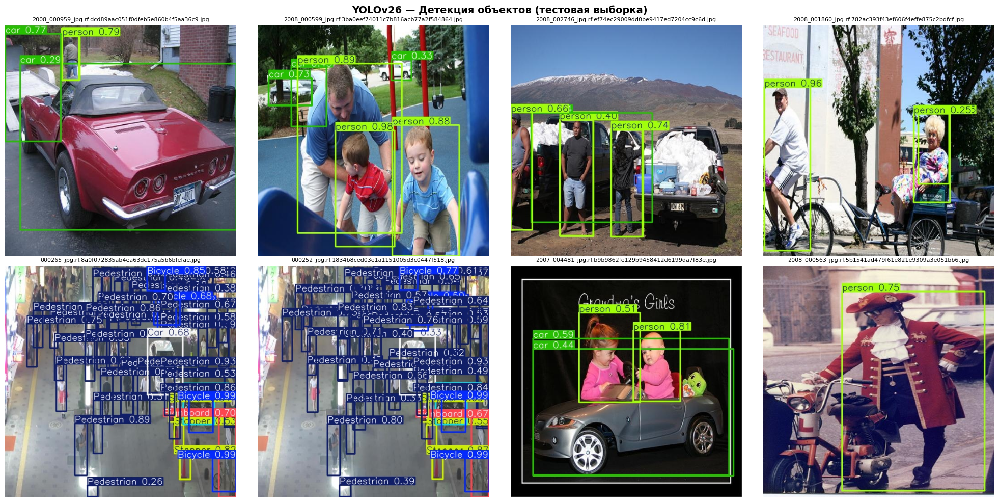

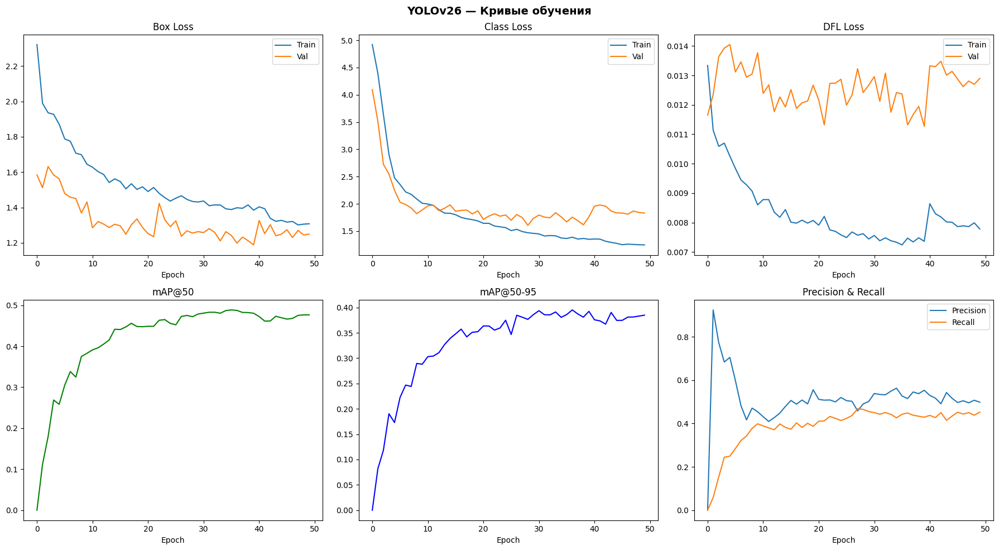

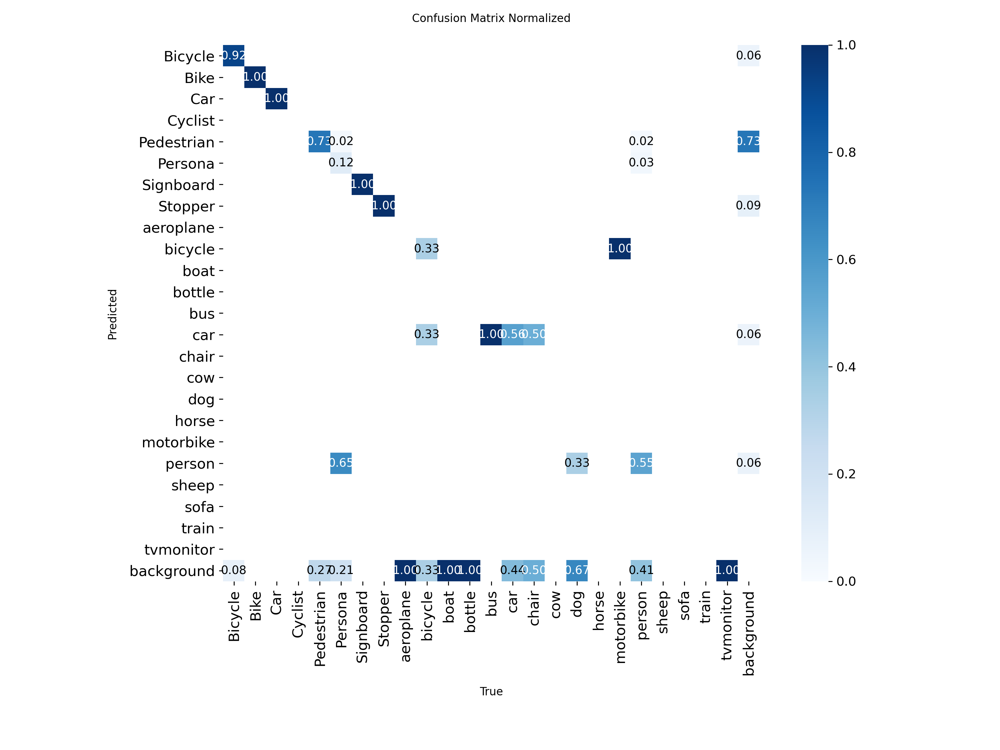

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path

# Загрузка обученной модели
best_weights = "runs/detect/train/weights/best.pt"
model = YOLO(best_weights)

# Инференс на тестовом наборе
test_images_dir = os.path.join(dataset.location, "test", "images")

results_list = model.predict(
    source=test_images_dir,
    imgsz=640,
    conf=0.25,          # порог уверенности
    iou=0.45,           # порог NMS
    save=True,          # сохраняет картинки с боксами в runs/detect/predict/
    save_conf=True      # выводит значение conf на каждом боксе
)

# Метрики
metrics = model.val(data=os.path.join(dataset.location, "data.yaml"))

print(f"\n{'='*45}")
print(f"  mAP@50:      {metrics.box.map50:.4f}")
print(f"  mAP@50-95:   {metrics.box.map:.4f}")
print(f"  Precision:   {metrics.box.mp:.4f}")
print(f"  Recall:      {metrics.box.mr:.4f}")
print(f"{'='*45}\n")

# Отображение 8 случайных предсказаний
import random
import numpy as np

# Папка, куда YOLO сохранила картинки с нанесёнными боксами
pred_dir = sorted(Path("runs/detect").glob("predict*"))[-1]  # последний predict
pred_images = list(pred_dir.glob("*.jpg")) + list(pred_dir.glob("*.png"))
random.shuffle(pred_images)
sample = pred_images[:8]

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for ax, img_path in zip(axes, sample):
    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.set_title(img_path.name, fontsize=8)
    ax.axis("off")

# Скрываем лишние axes, если картинок меньше 8
for i in range(len(sample), len(axes)):
    axes[i].set_visible(False)

plt.suptitle("YOLOv26 — Детекция объектов (тестовая выборка)", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# Графики обучения
results_csv = "runs/detect/train/results.csv"

import pandas as pd
df = pd.read_csv(results_csv)
df.columns = df.columns.str.strip()  # убираем лишние пробелы

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Box loss (train и val)
axes[0, 0].plot(df["train/box_loss"], label="Train")
axes[0, 0].plot(df["val/box_loss"],   label="Val")
axes[0, 0].set_title("Box Loss")
axes[0, 0].legend(); axes[0, 0].set_xlabel("Epoch")

# Class loss
axes[0, 1].plot(df["train/cls_loss"], label="Train")
axes[0, 1].plot(df["val/cls_loss"],   label="Val")
axes[0, 1].set_title("Class Loss")
axes[0, 1].legend(); axes[0, 1].set_xlabel("Epoch")

# DFL loss
if "train/dfl_loss" in df.columns:
    axes[0, 2].plot(df["train/dfl_loss"], label="Train")
    axes[0, 2].plot(df["val/dfl_loss"],   label="Val")
    axes[0, 2].set_title("DFL Loss")
    axes[0, 2].legend(); axes[0, 2].set_xlabel("Epoch")
else:
    axes[0, 2].set_visible(False)

# mAP@50
axes[1, 0].plot(df["metrics/mAP50(B)"], color="green")
axes[1, 0].set_title("mAP@50")
axes[1, 0].set_xlabel("Epoch")

# mAP@50-95
axes[1, 1].plot(df["metrics/mAP50-95(B)"], color="blue")
axes[1, 1].set_title("mAP@50-95")
axes[1, 1].set_xlabel("Epoch")

# Precision & Recall
axes[1, 2].plot(df["metrics/precision(B)"], label="Precision")
axes[1, 2].plot(df["metrics/recall(B)"],    label="Recall")
axes[1, 2].set_title("Precision & Recall")
axes[1, 2].legend(); axes[1, 2].set_xlabel("Epoch")

plt.suptitle("YOLOv26 — Кривые обучения", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# Confusion Matrix
from IPython.display import Image as IPImage, display

cm_path = "runs/detect/train/confusion_matrix_normalized.png"
if os.path.exists(cm_path):
    display(IPImage(cm_path, width=700))

## **Задание 3. Сформируйте свой датасет для детекции объектов и обучите на нем модель YOLOv26**



Требования к датасету:

- Количество изображений в датасете: минимум 90
- Количество классов: более 2х
- Обязательно должны присутствовать изображения, содержащие несколько классов одновременно


*Примечание: Формирование датасета включает в себя поиск изображений и ручное аннотирование объектов на изображениях.*

🧹 Очистка старых запусков...
✅ Старые запуски удалены

loading Roboflow workspace...
loading Roboflow project...
📂 Датасет загружен: /content/mysecondproject-1
📄 data.yaml:

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 12
names: ['big camera', 'camera', 'gamepad', 'headphones', 'keyboard', 'laptop', 'mouse', 'pods', 'pods case', 'smarphone', 'smart watches', 'tablet']

roboflow:
  workspace: -rok2b
  project: mysecondproject-aodkq
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/-rok2b/mysecondproject-aodkq/dataset/1


🚀 Запуск обучения...

Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/mysecondproject-1/

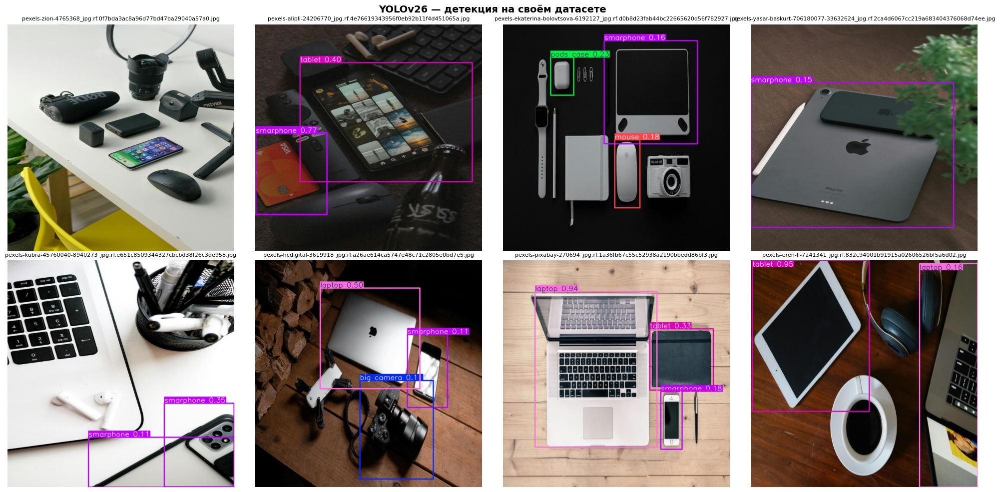


📊 Confusion Matrix:



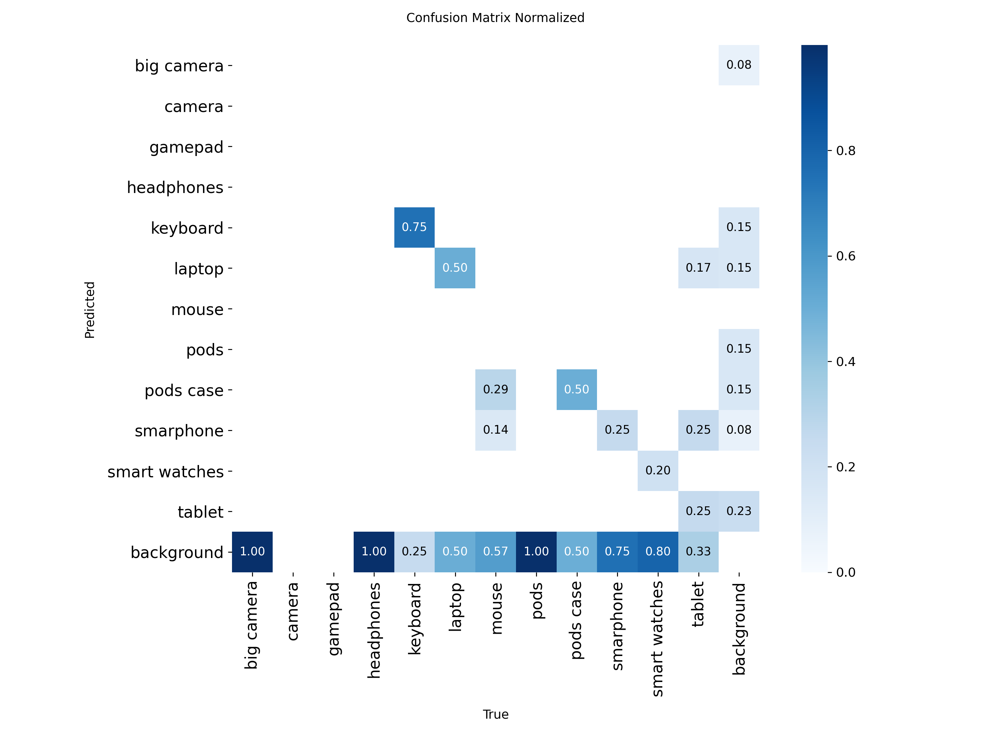


✅ Готово!


In [ ]:
from pathlib import Path

if Path("/content/runs/detect").exists():
    shutil.rmtree("/content/runs/detect")
print("✅ Старые запуски удалены\n")


RF_API_KEY = "UuRJ1ewAVoaCpX4GC43H"

rf = Roboflow(api_key=RF_API_KEY)
workspace = rf.workspace("-rok2b")
project = workspace.project("mysecondproject-aodkq")
version = project.version(1)

dataset = version.download("yolo26")
data_yaml = os.path.join(dataset.location, "data.yaml")

print(f"📂 Датасет загружен: {dataset.location}")
print(f"📄 data.yaml:\n")
print(open(data_yaml).read())
print("\n" + "="*60 + "\n")


model = YOLO("yolo26n.pt")

print("🚀 Запуск обучения...\n")
results = model.train(
    data=data_yaml,
    epochs=50,
    imgsz=640,
    batch=16,
    project="/content/runs/detect",
    name="mysecondproject_train",
    exist_ok=False,                   #
    patience=10,
    verbose=True
)



best_weights = "/content/runs/detect/mysecondproject_train/weights/best.pt"

if not os.path.exists(best_weights):
    raise FileNotFoundError(f" Веса не найдены: {best_weights}")

print(f"\nЗагружаем веса: {best_weights}")
trained_model = YOLO(best_weights)

# Проверка классов модели
print("\nКлассы в загруженной модели:")
print(trained_model.names)  # должны быть  12 классов
print("\n" + "="*60 + "\n")

# Валидация
print("Валидация на своём датасете...\n")
metrics = trained_model.val(
    data=data_yaml,
    split='val',
    conf=0.001,  #  низкий порог, чтобы увидеть ВСЕ предсказания
    iou=0.45,
    verbose=True
)

print(f"\n{'='*60}")
print(f"  📊 МЕТРИКИ :")
print(f"{'='*60}")
print(f"  mAP@50:      {metrics.box.map50:.4f}")
print(f"  mAP@50-95:   {metrics.box.map:.4f}")
print(f"  Precision:   {metrics.box.mp:.4f}")
print(f"  Recall:      {metrics.box.mr:.4f}")
print(f"{'='*60}\n")

# Метрики по классам
print("📈 По классам:\n")
for cls_id, cls_name in trained_model.names.items():
    map_val = metrics.box.maps[cls_id] if cls_id < len(metrics.box.maps) else 0.0
    print(f"  {cls_name:20} — mAP@50-95: {map_val:.3f}")

# Инференс на тесте
test_dir = os.path.join(dataset.location, "test", "images")
print(f"\n🔍 Инференс: {test_dir}\n")

results_list = trained_model.predict(
    source=test_dir,
    conf=0.1,  # низкий порог
    iou=0.45,
    save=True,
    project="/content/runs/detect",
    name="mysecondproject_test"
)

print(f"\nИнференс завершён: {len(results_list)} изображений\n")

# Статистика детекций
class_counts = {}
for result in results_list:
    for box in result.boxes:
        cls_id = int(box.cls[0])
        cls_name = result.names[cls_id]
        class_counts[cls_name] = class_counts.get(cls_name, 0) + 1

if class_counts:
    total = sum(class_counts.values())
    print(f"📊 Детекции (всего {total}):\n")
    for cls_name, count in sorted(class_counts.items(), key=lambda x: x[1], reverse=True):
        pct = count / total * 100
        print(f"  {cls_name:20} — {count:4} ({pct:5.1f}%)")
else:
    print(" Детекций не найдено")

#  ВИЗУАЛИЗАЦИЯ
import matplotlib.pyplot as plt
import cv2
import random

pred_dir = Path("/content/runs/detect/mysecondproject_test")
pred_images = sorted(list(pred_dir.glob("*.jpg")) + list(pred_dir.glob("*.png")))
random.shuffle(pred_images)
sample = pred_images[:8]

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for ax, img_path in zip(axes, sample):
    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.set_title(img_path.name, fontsize=8)
    ax.axis("off")

for i in range(len(sample), 8):
    axes[i].set_visible(False)

plt.suptitle("YOLOv26 — детекция на своём датасете", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# Confusion Matrix
cm_path = "/content/runs/detect/mysecondproject_train/confusion_matrix_normalized.png"
if os.path.exists(cm_path):
    from IPython.display import Image as IPImage, display
    print("\n📊 Confusion Matrix:\n")
    display(IPImage(cm_path, width=800))

print("\n✅ Готово!")

## **Задание 4 (для магистрантов). Обучите модель YOLOv26 на датасете [RSD-GOD](https://github.com/Dr-Zhuang/geospatial-object-detection). Затем самостоятельно сформируйте тестовые данные (не менее 50 изображений с аннотациями) и оцените качество обученной модели:**



**Прямая ссылка на загрузку датасета: [загрузить](https://drive.google.com/open?id=1ttvSta0BRxW7tTV_st89vSb_obHVre34)**

**Ссылка на датасет в среде roboflow universe:** https://universe.roboflow.com/animals-sqrdn/rsd-god

 *Примечание: для поиска данных удобно использовать сервис Google Earth/Google Earth Engine*

In [ ]:
# Ваш код# ===== Задание 4. RSD-GOD — обучение =====
import os
import shutil
from pathlib import Path
from roboflow import Roboflow
from ultralytics import YOLO

# Очистка старых запусков
if Path("/content/runs/detect").exists():
    shutil.rmtree("/content/runs/detect")

# Загрузка RSD-GOD из Roboflow Universe
RF_API_KEY = "UuRJ1ewAVoaCpX4GC43H"

rf = Roboflow(api_key=RF_API_KEY)

# Вариант A: через Universe (публичный проект)
project = rf.workspace("animals-sqrdn").project("rsd-god")
version = project.version(1)  # или актуальная версия

dataset = version.download("yolo26")
data_yaml = os.path.join(dataset.location, "data.yaml")

print(f" RSD-GOD загружен: {dataset.location}")
print(f"\n data.yaml:\n{open(data_yaml).read()}\n")
print("="*60 + "\n")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to RSD-GOD-1 in yolo26:: 100%|██████████| 19685/19685 [00:09<00:00, 2140.82it/s]


📂 RSD-GOD загружен: /content/RSD-GOD-1

📄 data.yaml:
train: ../train/images
val: ../valid/images
test: ../test/images

nc: 5
names: ['airport', 'helicopter', 'oiltank', 'plane', 'warship']

roboflow:
  workspace: animals-sqrdn
  project: rsd-god
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/animals-sqrdn/rsd-god/dataset/1




In [ ]:
# Обучение на RSD-GOD
model = YOLO("yolo26n.pt")

print("🚀 Обучение YOLOv26 на RSD-GOD...\n")

results = model.train(
    data=data_yaml,
    epochs=20,          # больше эпох для сложного датасета
    imgsz=416,
    batch=32,
    project="/content/runs/detect",
    name="rsd_god_train",
    patience=5,
    save_period=20,
    verbose=True
)

print("\n✅ Обучение завершено!")

# Валидация
best_model = YOLO("/content/runs/detect/rsd_god_train/weights/best.pt")
metrics = best_model.val(data=data_yaml, conf=0.25)

print(f"\n{'='*60}")
print(f"  📊 МЕТРИКИ на RSD-GOD валидации:")
print(f"{'='*60}")
print(f"  mAP@50:      {metrics.box.map50:.4f}")
print(f"  mAP@50-95:   {metrics.box.map:.4f}")
print(f"  Precision:   {metrics.box.mp:.4f}")
print(f"  Recall:      {metrics.box.mr:.4f}")
print(f"{'='*60}\n")

🚀 Обучение YOLOv26 на RSD-GOD...

Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/RSD-GOD-1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=416, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=rsd_god_train-2, nbs=64, nms=False, opset=None, optimize=False, optimize

In [23]:
from roboflow import Roboflow
from ultralytics import YOLO

# Загружаем тестовый датасет
rf = Roboflow(api_key="9EGEPV4Akg5FiugcLz0k")
project = rf.workspace("study-btrrr").project("rsd-god-test")
version = project.version(1)
test_dataset = version.download("yolov8")

# Загружаем обученную модель
best_model = YOLO("/content/runs/detect/rsd_god_train/weights/best.pt")

# Оцениваем на тестовых данных
test_metrics = model.val(
    data=f"{test_dataset.location}/data.yaml",
    split="test"
)

print(f"mAP50:     {test_metrics.box.map50:.3f}")
print(f"mAP50-95:  {test_metrics.box.map:.3f}")
print(f"Precision: {test_metrics.box.mp:.3f}")
print(f"Recall:    {test_metrics.box.mr:.3f}")

loading Roboflow workspace...
loading Roboflow project...
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26n summary (fused): 122 layers, 2,375,811 parameters, 0 gradients, 5.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 874.7±233.2 MB/s, size: 40.5 KB)
val: Scanning /content/rsd-god-test-1/test/labels... 49 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 49/49 1.5Kit/s 0.0s
val: New cache created: /content/rsd-god-test-1/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 2.2it/s 1.9s
                   all         49        132      0.716      0.766      0.772      0.386
               airport         10         10      0.214        0.2      0.185     0.0983
            helicopter         11         30       0.99          1      0.995      0.506
               oiltank         17         26      0.541      0.692      0.718      0.301
                 p


image 1/49 /content/rsd-god-test-1/test/images/airbase_100_jpg.rf.ebbf3bc1c0ae73a22f6c8d503dafa3f6.jpg: 416x384 1 airport, 50.1ms
image 2/49 /content/rsd-god-test-1/test/images/airbase_1092_jpg.rf.950b898f3d810565e8a5789eaa2d71ef.jpg: 352x416 1 airport, 28.6ms
image 3/49 /content/rsd-god-test-1/test/images/airbase_1119_jpg.rf.ffac23435b711c9d16d6e9f987a8b4cf.jpg: 352x416 1 airport, 18.6ms
image 4/49 /content/rsd-god-test-1/test/images/airbase_1167_jpg.rf.8ecd66bd2d5e9b8d5ac03d7adf535e1e.jpg: 352x416 1 airport, 28.6ms
image 5/49 /content/rsd-god-test-1/test/images/airbase_1180_jpg.rf.edb192de28699694103a8f098936624f.jpg: 416x416 1 airport, 22.1ms
image 6/49 /content/rsd-god-test-1/test/images/airbase_1187_jpg.rf.24f0fadefce3facec7634360d8a149f3.jpg: 416x416 1 airport, 46.3ms
image 7/49 /content/rsd-god-test-1/test/images/airbase_1209_jpg.rf.8b88c21c74e8fa5adf0742159ca8c8ca.jpg: 352x416 1 airport, 30.0ms
image 8/49 /content/rsd-god-test-1/test/images/airbase_1279_jpg.rf.6b8ee7b27688a799

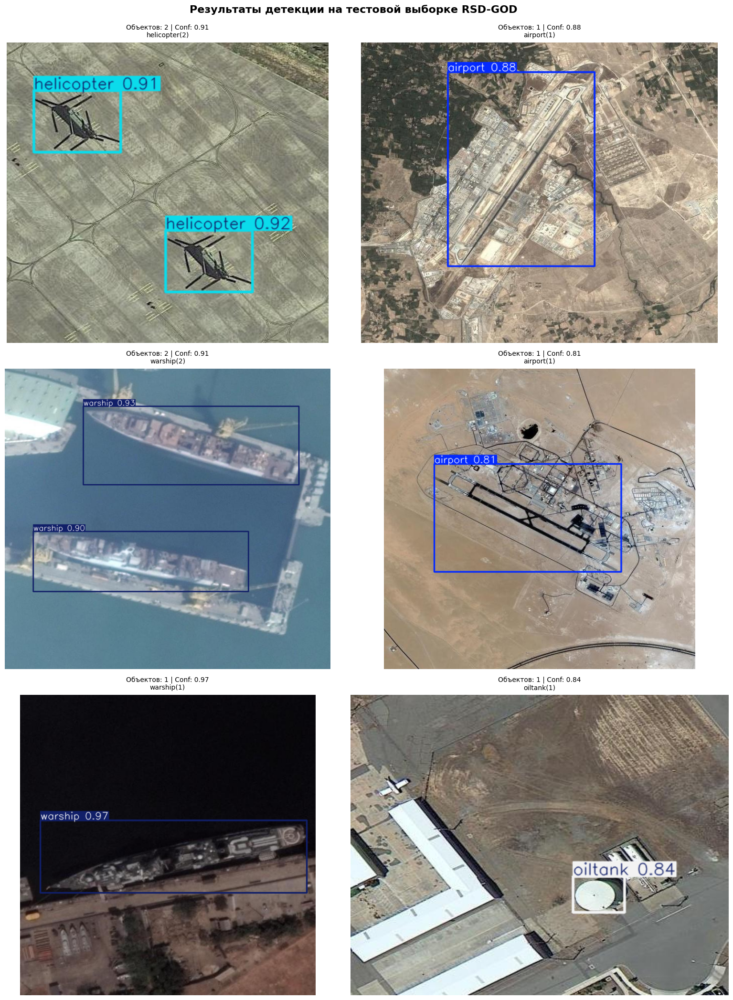


📊 СТАТИСТИКА ДЕТЕКЦИЙ НА ТЕСТОВОМ НАБОРЕ

Всего изображений:        49
С детекциями:             48 (98.0%)
Без детекций:             1 (2.0%)
Всего детекций:           161
Среднее детекций/кадр:    3.29

Класс                       Детекций    Процент
-----------------------------------------------
plane                             61      37.9%
oiltank                           37      23.0%
helicopter                        33      20.5%
warship                           19      11.8%
airport                           11       6.8%

Средний Confidence:            0.676
Минимальный:                   0.257
Максимальный:                  0.969



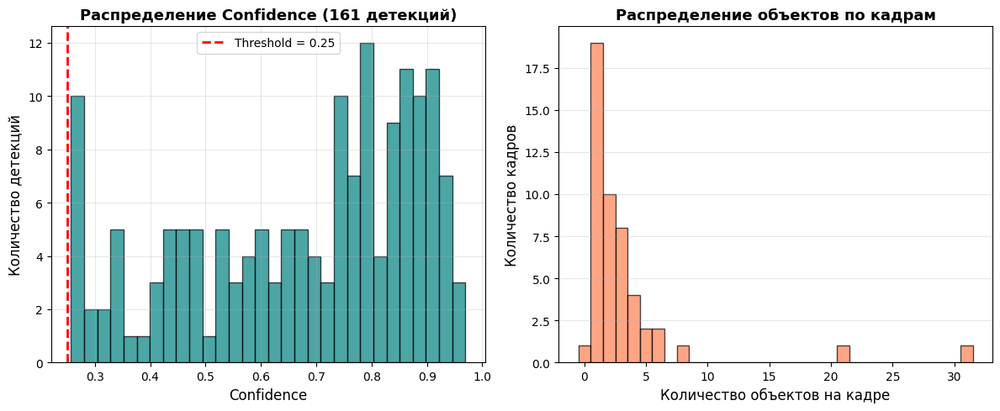


🔝 Топ-3 кадров с наибольшим количеством объектов:
  1. 31 объектов — {'plane': 30, 'oiltank': 1}
  2. 21 объектов — {'plane': 20, 'oiltank': 1}
  3. 8 объектов — {'oiltank': 8}


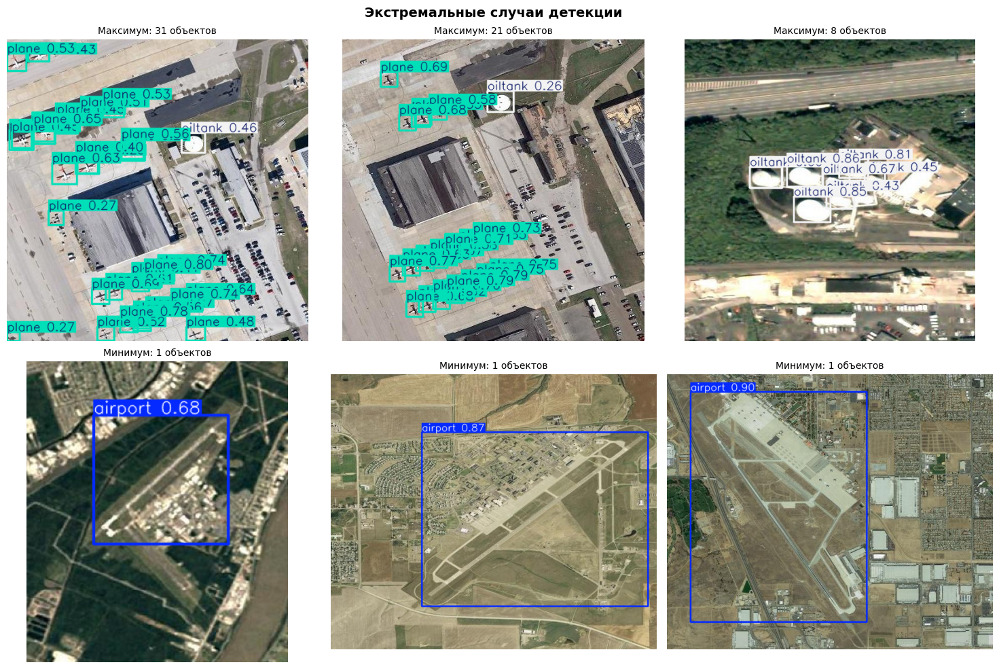


✅ Визуализация завершена!


In [25]:
import matplotlib.pyplot as plt
import cv2
import random
import numpy as np
from pathlib import Path


def visualize_predictions(results, num_samples=6, show_conf=True, show_classes=True):
    """
    Визуализация результатов детекции YOLO

    Args:
        results: список результатов model.predict()
        num_samples: количество изображений для отображения
        show_conf: показывать среднюю уверенность
        show_classes: показывать найденные классы
    """
    selected = random.sample(results, min(num_samples, len(results)))
    cols = 2
    rows = (num_samples + 1) // 2

    fig, axes = plt.subplots(rows, cols, figsize=(16, 7*rows))
    axes = axes.flatten() if num_samples > 1 else [axes]

    for ax, result in zip(axes, selected):
        # Отрисованное изображение с боксами
        annotated = result.plot()
        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        ax.imshow(annotated_rgb)

        # Формируем заголовок
        num_detections = len(result.boxes)
        title_parts = [f'Объектов: {num_detections}']

        if num_detections > 0 and show_conf:
            avg_conf = float(result.boxes.conf.mean())
            title_parts.append(f'Conf: {avg_conf:.2f}')

        if num_detections > 0 and show_classes:
            # Подсчёт объектов по классам
            class_counts = {}
            for box in result.boxes:
                cls_id = int(box.cls[0])
                cls_name = result.names[cls_id]
                class_counts[cls_name] = class_counts.get(cls_name, 0) + 1

            # Топ-3 класса
            top_classes = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)[:3]
            classes_str = ', '.join([f'{name}({cnt})' for name, cnt in top_classes])
            title_parts.append(f'\n{classes_str}')

        ax.set_title(' | '.join(title_parts[:2]) + (title_parts[2] if len(title_parts) > 2 else ''),
                     fontsize=10, pad=8)
        ax.axis('off')

    # Скрыть лишние оси
    for ax in axes[len(selected):]:
        ax.axis('off')

    plt.suptitle('Результаты детекции на тестовой выборке RSD-GOD',
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()


# ===== Запуск инференса =====
test_results = model.predict(
    source="/content/rsd-god-test-1/test/images",
    conf=0.25,
    iou=0.45,
    save=False,
    verbose=True
)

print(f"\n✅ Обработано изображений: {len(test_results)}")

# ===== Визуализация =====
visualize_predictions(test_results, num_samples=6, show_conf=True, show_classes=True)


# ===== Дополнительная статистика =====
print("\n" + "="*60)
print("📊 СТАТИСТИКА ДЕТЕКЦИЙ НА ТЕСТОВОМ НАБОРЕ")
print("="*60)

total_detections = sum(len(r.boxes) for r in test_results)
images_with_detections = sum(1 for r in test_results if len(r.boxes) > 0)
images_without = len(test_results) - images_with_detections

print(f"\nВсего изображений:        {len(test_results)}")
print(f"С детекциями:             {images_with_detections} ({images_with_detections/len(test_results)*100:.1f}%)")
print(f"Без детекций:             {images_without} ({images_without/len(test_results)*100:.1f}%)")
print(f"Всего детекций:           {total_detections}")
print(f"Среднее детекций/кадр:    {total_detections/len(test_results):.2f}")

# Статистика по классам
class_counts = {}
all_confidences = []

for result in test_results:
    for box in result.boxes:
        cls_id = int(box.cls[0])
        cls_name = result.names[cls_id]
        class_counts[cls_name] = class_counts.get(cls_name, 0) + 1
        all_confidences.append(float(box.conf[0]))

if class_counts:
    print(f"\n{'Класс':<25} {'Детекций':>10} {'Процент':>10}")
    print("-" * 47)
    for cls_name, count in sorted(class_counts.items(), key=lambda x: x[1], reverse=True):
        pct = count / total_detections * 100
        print(f"{cls_name:<25} {count:>10} {pct:>9.1f}%")

    print(f"\n{'Средний Confidence:':<25} {np.mean(all_confidences):>10.3f}")
    print(f"{'Минимальный:':<25} {np.min(all_confidences):>10.3f}")
    print(f"{'Максимальный:':<25} {np.max(all_confidences):>10.3f}")

print("\n" + "="*60)


# ===== График распределения Confidence =====
if all_confidences:
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.hist(all_confidences, bins=30, color='teal', alpha=0.7, edgecolor='black')
    plt.axvline(x=0.25, color='red', linestyle='--', linewidth=2, label='Threshold = 0.25')
    plt.xlabel('Confidence', fontsize=12)
    plt.ylabel('Количество детекций', fontsize=12)
    plt.title(f'Распределение Confidence ({len(all_confidences)} детекций)',
              fontsize=13, fontweight='bold')
    plt.legend()
    plt.grid(alpha=0.3)

    plt.subplot(1, 2, 2)
    # Детекций на изображение
    detections_per_image = [len(r.boxes) for r in test_results]
    plt.hist(detections_per_image, bins=range(0, max(detections_per_image)+2),
             color='coral', alpha=0.7, edgecolor='black', align='left')
    plt.xlabel('Количество объектов на кадре', fontsize=12)
    plt.ylabel('Количество кадров', fontsize=12)
    plt.title('Распределение объектов по кадрам', fontsize=13, fontweight='bold')
    plt.grid(alpha=0.3, axis='y')

    plt.tight_layout()
    plt.show()


# ===== Показать примеры с наибольшим/наименьшим количеством детекций =====
def show_extremes(results, num_each=3):
    """Показать кадры с максимальным и минимальным количеством детекций"""
    sorted_results = sorted(results, key=lambda r: len(r.boxes), reverse=True)

    print(f"\n🔝 Топ-{num_each} кадров с наибольшим количеством объектов:")
    for i, result in enumerate(sorted_results[:num_each], 1):
        num_objs = len(result.boxes)
        classes = {}
        for box in result.boxes:
            cls_name = result.names[int(box.cls[0])]
            classes[cls_name] = classes.get(cls_name, 0) + 1
        print(f"  {i}. {num_objs} объектов — {dict(classes)}")

    fig, axes = plt.subplots(2, num_each, figsize=(15, 10))

    # Топ детекций
    for i, result in enumerate(sorted_results[:num_each]):
        annotated = result.plot()
        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        axes[0, i].imshow(annotated_rgb)
        axes[0, i].set_title(f'Максимум: {len(result.boxes)} объектов', fontsize=10)
        axes[0, i].axis('off')

    # Минимум детекций (только те, где есть хоть 1 объект)
    with_detections = [r for r in results if len(r.boxes) > 0]
    sorted_min = sorted(with_detections, key=lambda r: len(r.boxes))

    for i, result in enumerate(sorted_min[:num_each]):
        annotated = result.plot()
        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        axes[1, i].imshow(annotated_rgb)
        axes[1, i].set_title(f'Минимум: {len(result.boxes)} объектов', fontsize=10)
        axes[1, i].axis('off')

    plt.suptitle('Экстремальные случаи детекции', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

show_extremes(test_results, num_each=3)

print("\n✅ Визуализация завершена!")